# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 32

**Author 1 (sciper):** Alexia Dormann (301997)  
**Author 2 (sciper):** Valgerdur Jónsdóttir (351819)   
**Author 3 (sciper):** Student Name 3 (xxxxx)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [1]:
import tarfile
import os

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

..\data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

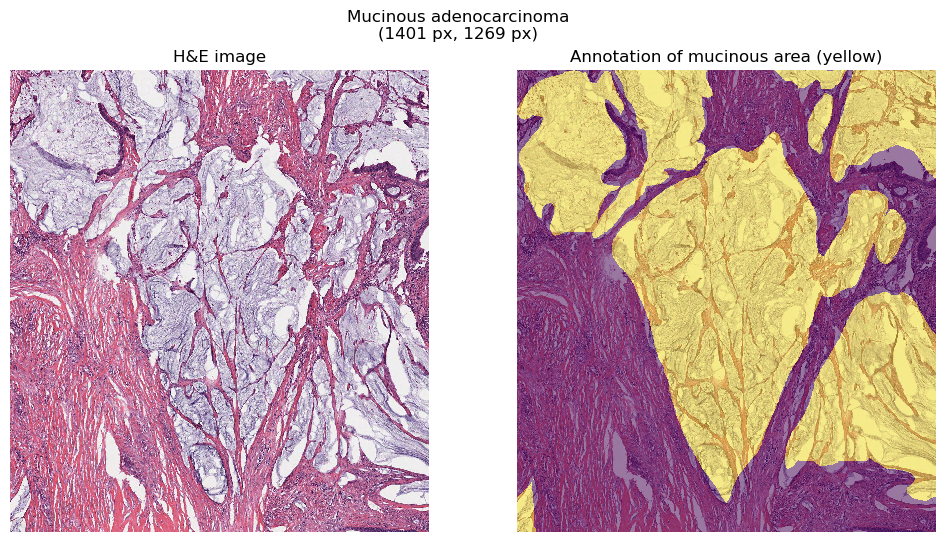

In [2]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

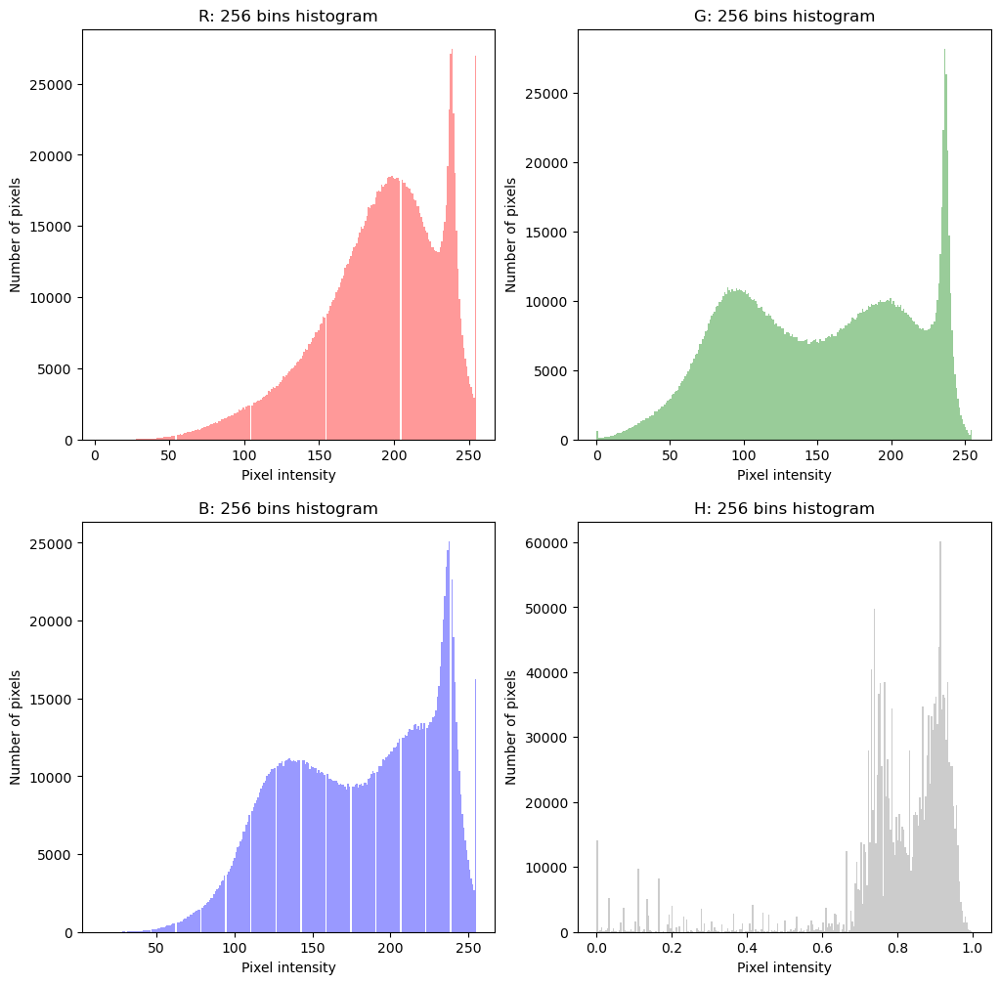

In [3]:
import skimage.color

nb_bins = 256

# Create figure
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

# Display histogram
ax[0,0].hist(adeno_img[:,:,0].ravel(), color = 'red', bins=nb_bins, alpha=0.4)
ax[0,0].set_xlabel('Pixel intensity')
ax[0,0].set_ylabel('Number of pixels')
ax[0,0].set_title('R: 256 bins histogram')

ax[0,1].hist(adeno_img[:,:,1].ravel(), color = 'green', bins=nb_bins, alpha=0.4)
ax[0,1].set_xlabel('Pixel intensity')
ax[0,1].set_ylabel('Number of pixels')
ax[0,1].set_title('G: 256 bins histogram')

ax[1,0].hist(adeno_img[:,:,2].ravel(), color = 'blue', bins=nb_bins, alpha=0.4)
ax[1,0].set_xlabel('Pixel intensity')
ax[1,0].set_ylabel('Number of pixels')
ax[1,0].set_title('B: 256 bins histogram')

# converting RGB image to HSV
adeno_img_hsv = skimage.color.rgb2hsv(adeno_img)

ax[1,1].hist(adeno_img_hsv[:,:,0].ravel(), color = 'gray', bins=nb_bins, alpha=0.4)
ax[1,1].set_xlabel('Pixel intensity')
ax[1,1].set_ylabel('Number of pixels')
ax[1,1].set_title('H: 256 bins histogram')

plt.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

In our results, we used two kinds of thresholding methods to find the "optimal" threshold. 
1. In the first method, we used Otsu’s method to calculate a threshold by maximizing the variance between two classes of pixels. 
2. For our second method, we manually determined the thresholds by inspection of the obtained histograms. The threshold was defined as the intersection of the two Gaussians that seem to model the histograms.

By checking which of those two methods method gives the lower segmentation error for each of the channels, we are able determine the "optimal" threshold and use that for the final result of our segmentations.

In [4]:
# find the threshold for each channel
from skimage.filters import threshold_otsu

#Define Otsu's thresholds
thresh_red = threshold_otsu(adeno_img[:, :, 0])
thresh_green = threshold_otsu(adeno_img[:, :, 1])
thresh_blue = threshold_otsu(adeno_img[:, :, 2])
thresh_hue = threshold_otsu(adeno_img_hsv[:, :, 0])

otsu = [thresh_red, thresh_green, thresh_blue, thresh_hue]
print('Otsu thresholds:', otsu)

#Define manual thresholds
thres = [220,150,175,0.85]
print('Manual thresholds:', thres)

Otsu thresholds: [181, 150, 175, 0.5130603608630953]
Manual thresholds: [220, 150, 175, 0.85]


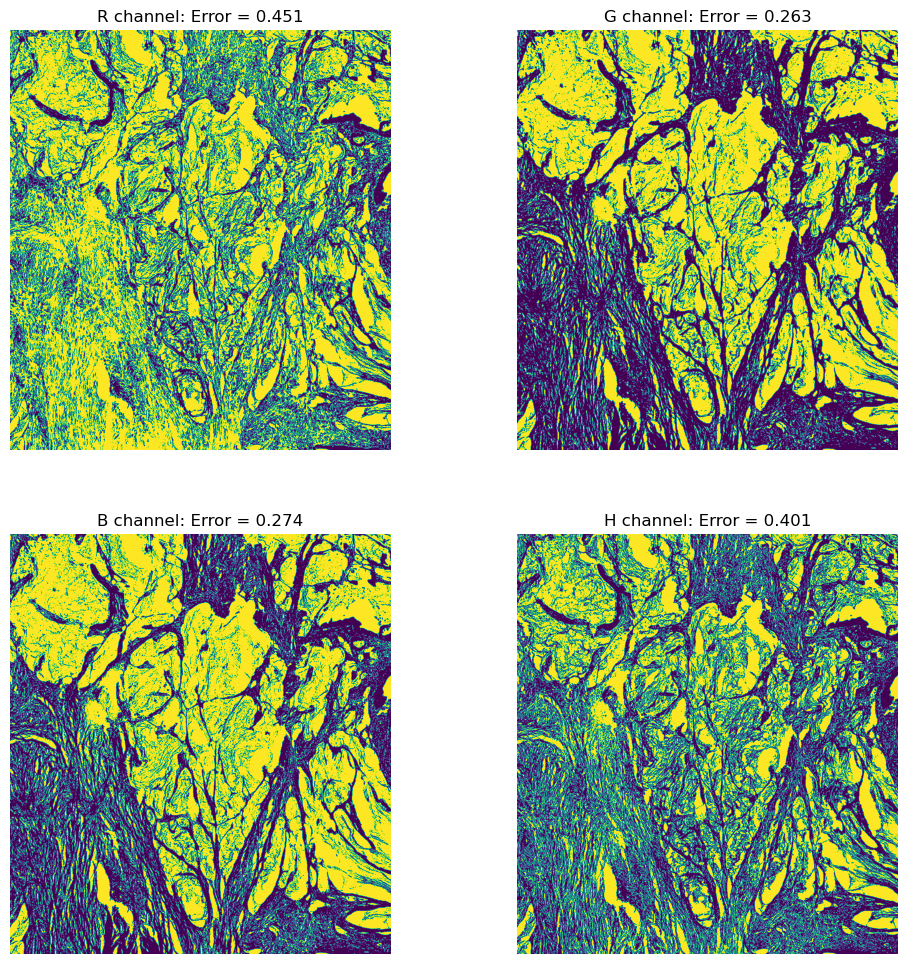

In [5]:
def compute_error(pred:np.array, annot:np.array):
    '''
    Compute the error between the prediction and the annotation.
    :param pred: the predicted image
    :param annot: the annotated image
    :return: the error
    '''
    return 1 - (1/(pred.shape[0]*pred.shape[1])) * np.sum(pred == annot)

#Apply thresholds on each channel
channel = ['R','G','B','H']

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
ax = ax.flatten()

#For R,G,B channels
for i in range(3):
    pred_otsu = adeno_img.copy()[:,:,i]
    pred_thres = adeno_img.copy()[:,:,i]

    # check best threshold method
    pred_otsu[pred_otsu < otsu[i]] = 0 
    pred_otsu[pred_otsu >= otsu[i]] = 1

    pred_thres[pred_thres < thres[i]] = 0 
    pred_thres[pred_thres >= thres[i]] = 1
    
    if compute_error(pred_otsu, adeno_gt) < compute_error(pred_thres, adeno_gt):
        pred = pred_otsu
        err = compute_error(pred_otsu, adeno_gt)
    else:
        pred = pred_thres
        err = compute_error(pred_thres, adeno_gt)
    
    #Display prediction  
    ax[i].imshow(pred)
    ax[i].set_title(channel[i] + f' channel: Error = {err:.3}')
    ax[i].axis('off')
  
#For Hue channel  
pred_otsu = skimage.color.hsv2rgb(adeno_img)[:,:,0].copy()
pred_thres = skimage.color.hsv2rgb(adeno_img)[:,:,0].copy()

# check best threshold method
pred_otsu[pred_otsu < otsu[3]] = 0 
pred_otsu[pred_otsu >= otsu[3]] = 1

pred_thres[pred_thres < thres[3]] = 0 
pred_thres[pred_thres >= thres[3]] = 1

if compute_error(pred_otsu, adeno_gt) < compute_error(pred_thres, adeno_gt):
    pred = pred_otsu
    err = compute_error(pred_otsu, adeno_gt)
else:
    pred = pred_thres
    err = compute_error(pred_thres, adeno_gt)
    
#Display prediction  
ax[3].imshow(pred)
ax[3].set_title(channel[3] + f' channel: Error = {err:.3}')
ax[3].axis('off'); plt.show()

#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

The best segmentation was achieved using the Green channel, as that channel gives the lowest segmentation error.

In [6]:
mask_thesholding = np.zeros_like(adeno_gt)
mask_thesholding[adeno_img[:,:,1] >= thres[1]] = 1 #Best: threshold for G channel

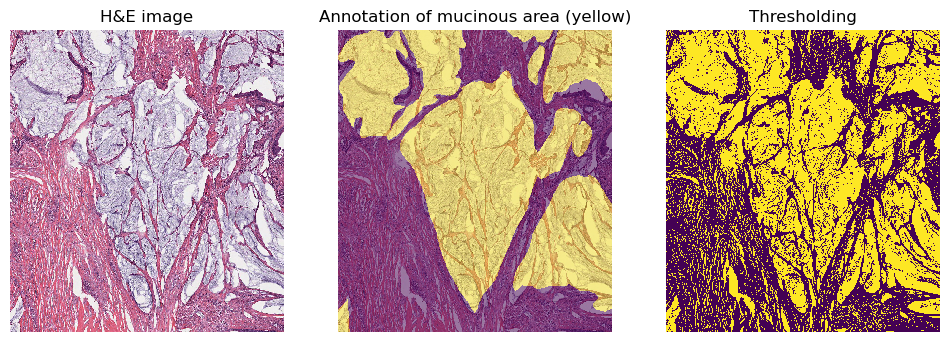

In [7]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

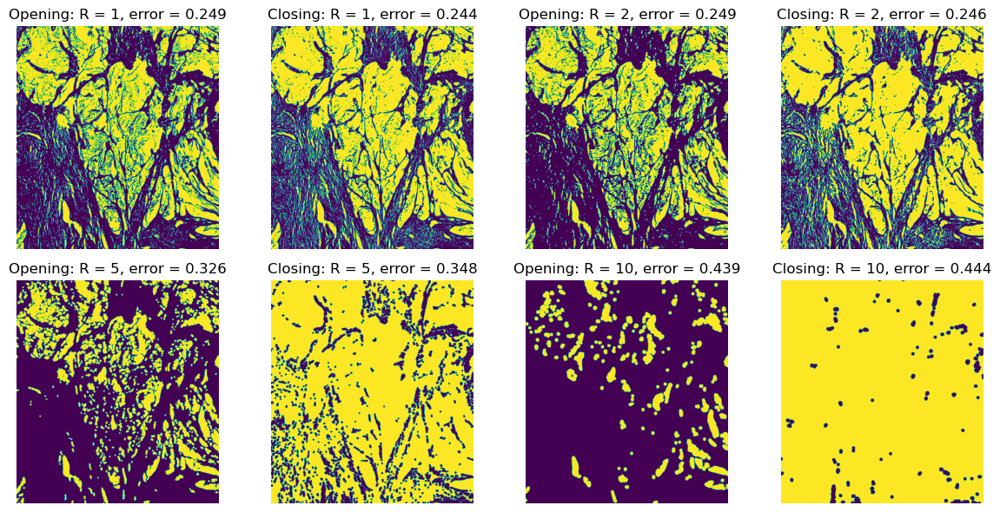

In [8]:
#Point A
from skimage.morphology import closing, opening, disk

fig, ax = plt.subplots(2, 4, figsize=(12, 6))
ax = ax.flatten()

radius = [1,2,5,10]
for i,r in enumerate(radius):
    #Create disk of radius r
    op_disk = disk(radius=r)
    
    #Opening operation
    opening_disk = opening(mask_thesholding, op_disk)
    err = compute_error(opening_disk, adeno_gt)
    
    ax[2*i].imshow(opening_disk)
    ax[2*i].set_title(f'Opening: R = {r}, error = {err:.3}')
    ax[2*i].axis('off')
    
    #Closing operation
    closing_disk = closing(mask_thesholding, op_disk)
    err = compute_error(closing_disk, adeno_gt)
    
    ax[2*i+1].imshow(closing_disk)
    ax[2*i+1].set_title(f'Closing: R = {r}, error = {err:.3}')
    ax[2*i+1].axis('off')
    
fig.tight_layout()

We observe that as the disk size gets larger, larger area of the masked image is filled for the closing operation. Also, the opening operation removes larger parts of the mucinous area as the disk size gets larger. With this in mind and also taking note of the segmentation error, we observe that the best results for both operations are obtained when using a disk size of 1 as it achieves the lowest error value.

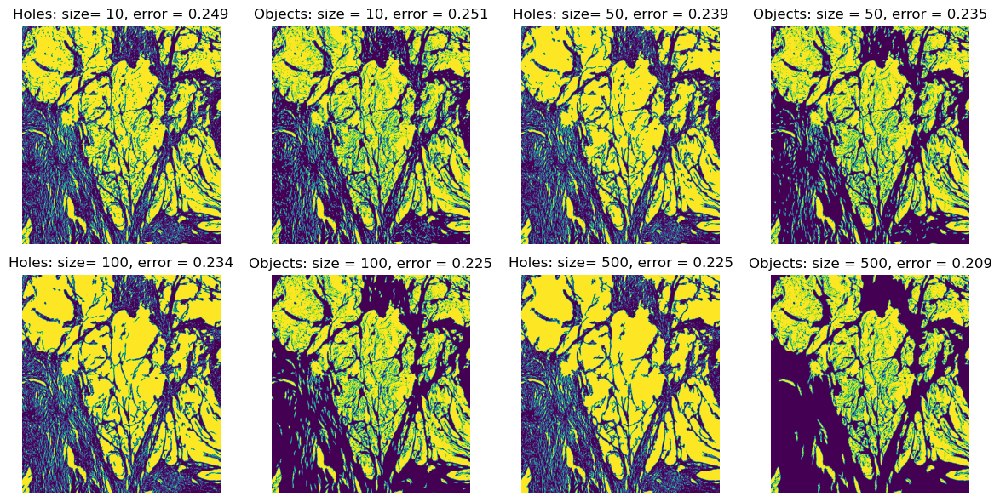

In [9]:
#Point B
from skimage.morphology import remove_small_holes, remove_small_objects

fig, ax = plt.subplots(2, 4, figsize=(12, 6))
ax = ax.flatten()

sizes = [10,50,100,500]
for i,s in enumerate(sizes):
    
    #Remove holes
    small_holes = remove_small_holes(mask_thesholding, area_threshold=s)
    err = compute_error(small_holes, adeno_gt)
    
    ax[2*i].imshow(small_holes)
    ax[2*i].set_title(f'Holes: size= {s}, error = {err:.3}')
    ax[2*i].axis('off')
    
    #Remove small objects
    small_objects = remove_small_objects(mask_thesholding,min_size=s)
    err = compute_error(small_objects, adeno_gt)
    
    ax[2*i+1].imshow(small_objects)
    ax[2*i+1].set_title(f'Objects: size = {s}, error = {err:.3}')
    ax[2*i+1].axis('off')
    
fig.tight_layout()

We observe that as the size gets larger, a larger part of the mucinous area get filled for the `remove_small_holes` operation, since it removes the small holes inside of it. Also, the `remove_small_objects` operation removes larger parts of the noise of the background as the size gets larger, and with size of 500 it performs quite well. 

Based on these results, we decide to perform:
1. `remove_small_holes` with a size of 5000
2. `remove_small_objects` with a size of 2700. 
3. closing with a disk radius 25
4. opening with disk radius 40

The sizes and radius were determined empirically, the one that acheived the lowest error were choosen.

We obtain the following result and error:

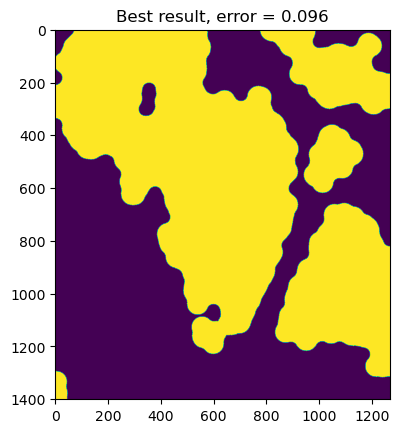

In [10]:
#Point C
mask_morph = remove_small_holes(mask_thesholding, area_threshold=5000)
mask_morph = remove_small_objects(mask_morph, min_size=2700)

op_disk = disk(radius=25)
mask_morph = closing(mask_morph, op_disk)

op_disk = disk(radius=40)
mask_morph = opening(mask_morph, op_disk)

err = compute_error(mask_morph, adeno_gt)

plt.imshow(mask_morph)
plt.title(f'Best result, error = {err:.3}')
plt.show()

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

In [11]:
def get_neighbors(idx:tuple, img_size:tuple):
    '''
    A function that finds the four closest neighbours of a pixel
    :param idx: a single pixel
    :param img_size: the size of the image
    :return: a list of tuples containing the coordinates of the neighbours
    '''
    neighbors = []
    
    if idx[0]-1 > -1:
        neighbors.append((idx[0]-1, idx[1]))
    if idx[0] + 1 < img_size[0]:
        neighbors.append((idx[0]+1, idx[1]))
    if idx[1]-1 > -1:
        neighbors.append((idx[0], idx[1]-1))
    if idx[1] + 1 < img_size[1]:
        neighbors.append((idx[0], idx[1]+1))
        
    return neighbors

def region_growing(img:np.array, mask_region:np.array, visited:np.array, seed:tuple, thres:int):
    '''
    The region growing algorithm
    :param img: the image to be segmented using region growing
    :param mask_region: the mask of the segmented region
    :param visited: an array of the same size as the image, containing 1 if the pixel has been visited, 0 otherwise
    :param seed: the seed point, which is the first pixel of the region
    :param thres: the threshold value
    :return: the segmented image and the visited array
    '''
    current_point = [seed]
    
    if img[seed] >= thres:
                mask_region[seed] = 1
    visited[seed] = 1
    
    while current_point: 
        neigh = get_neighbors(current_point[0], img.shape)
        current_point.pop(0)

        for i in neigh:
            if not visited[i] and img[i] >= thres:
                mask_region[i] = 1
                current_point.append(i)
            
            visited[i] = 1
              
    return mask_region, visited

In [12]:
mask_region = np.zeros_like(adeno_img[:,:,1])
visited = mask_region

for i in range(300):
    #Draw randomly seed from not visited pixels
    not_visited = np.argwhere(visited == 0)
    seed = np.random.randint(len(not_visited)); seed = (not_visited[seed][0], not_visited[seed][1])
    
    #Apply region growing
    mask_region, visited = region_growing(adeno_img[:,:,1], mask_region=mask_region, visited=visited,
                                          seed=seed, thres=150)

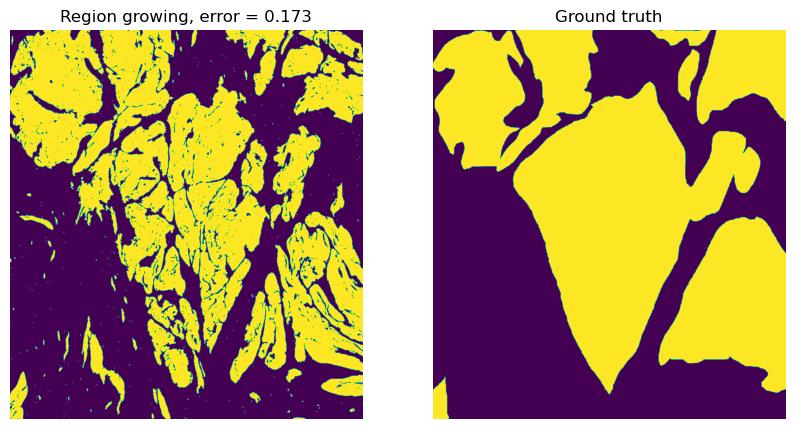

In [13]:
err = compute_error(mask_region, adeno_gt)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(mask_region); ax[0].axis('off')
ax[0].set_title(f'Region growing, error = {err:.3}')
ax[1].imshow(adeno_gt); ax[1].axis('off')
ax[1].set_title('Ground truth')

plt.show()

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

Based on our results, we observe that the morphology method and the region growing method perform the best. The morphology method is able to capture the mucinous area in the image with the minimum error. The threshold method and the region growing methods alone also perform well, but they are not able to capture the mucinous area as well as the morphology method, i.e., the segmentation method in these cases are more noisy.

Moreover, by applying the morphology operators on the region growing mask may yield better results than applying it on the threshold mask as it seems that the region growing method resulted in a less noisy segmentation and the error is lower.

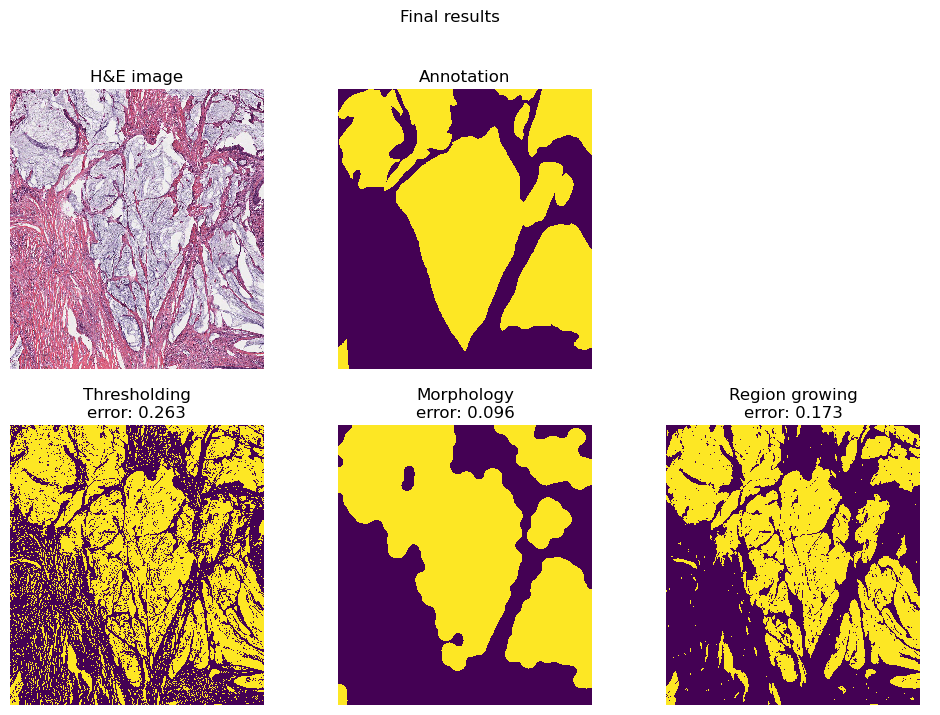

In [14]:
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))

# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))

[a.axis('off') for a in ax.ravel()]

plt.suptitle("Final results")
plt.show()

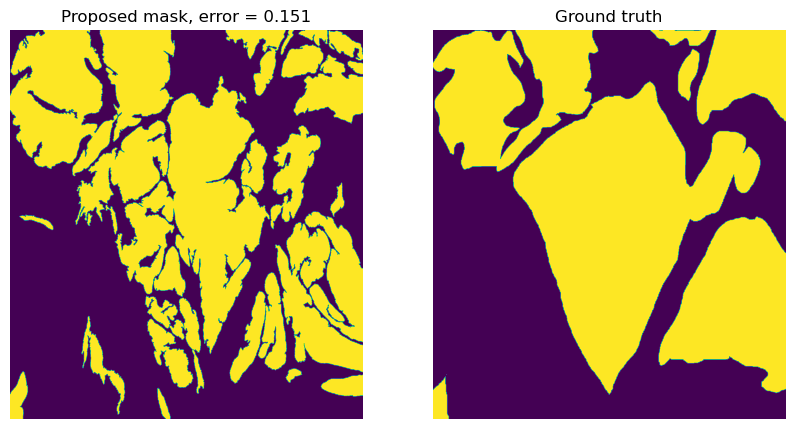

In [15]:
# morphological operations on the region growing mask
mask_proposed = mask_region.astype(dtype = bool)
mask_proposed = remove_small_objects(mask_proposed, 1000)
mask_proposed = remove_small_holes(mask_proposed, 2000)
#mask_proposed = closing(mask_proposed, disk(15))
#mask_proposed = opening(mask_proposed, disk(15))

err = compute_error(mask_proposed, adeno_gt)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(mask_proposed); ax[0].axis('off')
ax[0].set_title(f'Proposed mask, error = {err:.3}')
ax[1].imshow(adeno_gt); ax[1].axis('off')
ax[1].set_title('Ground truth')

plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. 
**Using this image as reference** 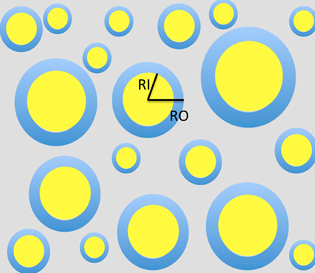

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 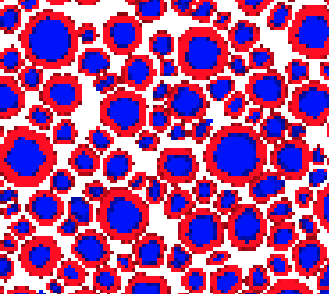

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

In [16]:
data_base_path

'..\\data'

..\data


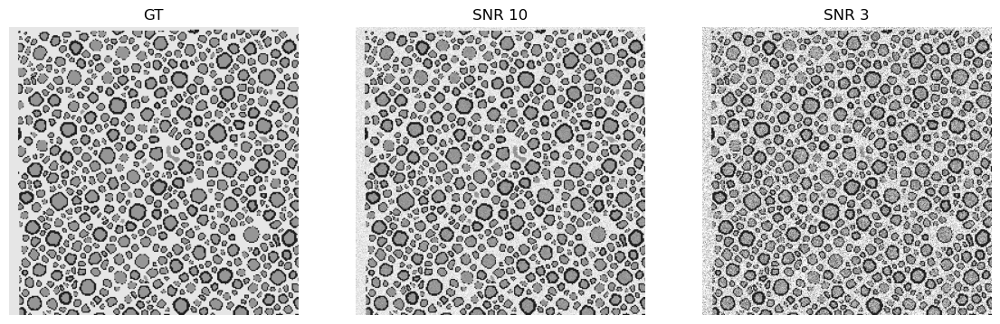

In [69]:
import cv2
import matplotlib.pyplot as plt

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv2.imread(path_folder+ files[0])
snr_10 = cv2.imread(path_folder+ files[1])
snr_3 = cv2.imread(path_folder+ files[2])

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(14, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing 

**How to get rid of small dots in the image?**

We want to apply a denoising filter to the images to reduce the noise. We use the `fastNlMeansDenoisingColored` function from the `OpenCV` module. We use the default parameters for the function, except the `h` parameter, we set it to 25 for SNR 10 and 30 for SNR 3. We observe that these values of `h` give the best results, since it is able to reduce the noise in the image. However, for SNR 3, the edges of the axons become more blurred after denoising compared to the denoising of SNR 10. This is because smaller values of `h` preserve the details of the image while preserving some noise, but larger values remove more image details, and at the same time more noise.

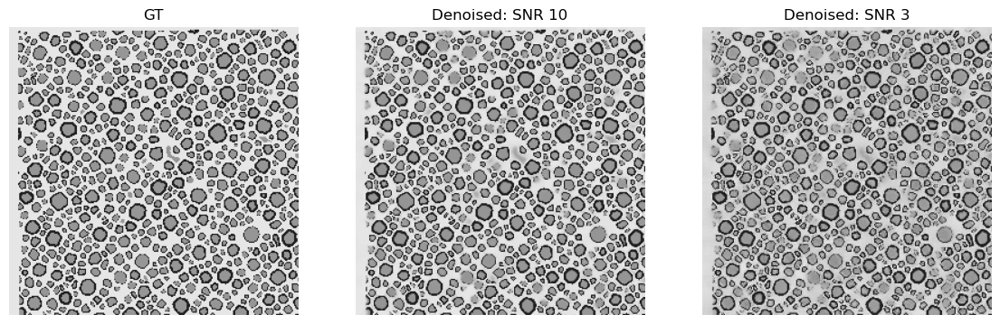

In [70]:
denoised_snr_10 = cv2.fastNlMeansDenoisingColored(snr_10, templateWindowSize= 7, searchWindowSize= 21, h=25)
denoised_snr_3 = cv2.fastNlMeansDenoisingColored(snr_3, templateWindowSize= 7, searchWindowSize= 21, h=30)

images = [gt_0 , denoised_snr_10, denoised_snr_3]
im_names = ["GT" , "Denoised: SNR 10" , "Denoised: SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(14, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

Below, we see the differences in the histograms of the three images after denoising. Moreover, we use the manual method, by inspection of the histogram, to define the segmentation thresholds.

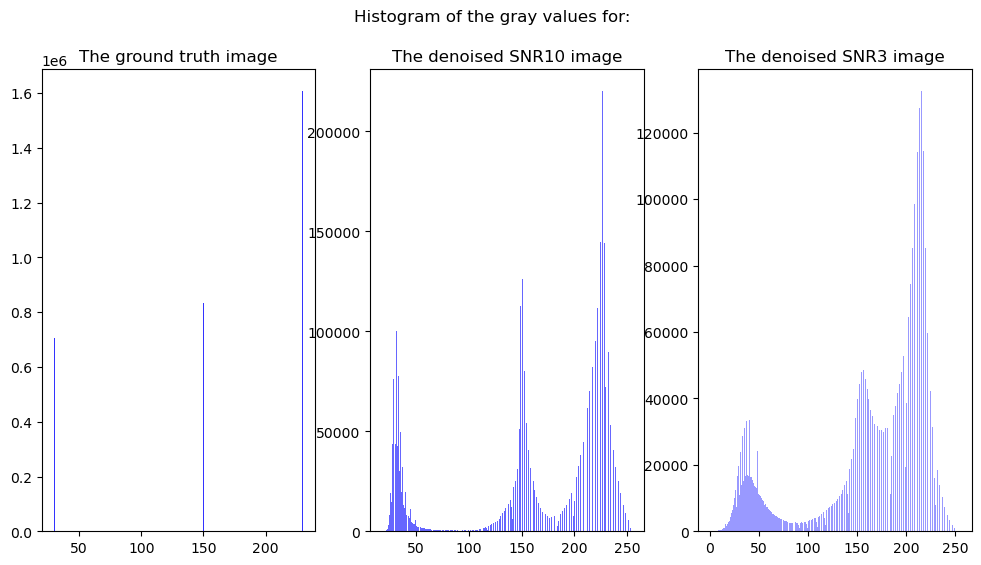

In [71]:
# Display histogram of each image
fig, ax = plt.subplots(1, 3, figsize=(12, 6))

ax[0].hist(gt_0.ravel(), bins = 256, color = 'blue', alpha = 0.8)
ax[0].set_title('The ground truth image')

ax[1].hist(denoised_snr_10.ravel(), bins = 256, color = 'blue', alpha = 0.6)
ax[1].set_title('The denoised SNR10 image')

ax[2].hist(denoised_snr_3.ravel(), bins = 256, color = 'blue', alpha = 0.4)
ax[2].set_title('The denoised SNR3 image')

plt.suptitle("Histogram of the gray values for:")
plt.show()


### 2.1.2 Results Segmetations

To segment the image we apply the thresholds as defined above. 

In [72]:
def segmentation_thresholds(img:np.array, thres:list):
    '''
    Segment images using thresholds observed from the histograms, with a white background, blue inner axons and red outer axons.
    :param img: the image to be segmented
    :param thres: list of threshold values
    :return: the segmented image
    '''
    seg = np.zeros_like(img)
    #Define background (white)
    seg[:,:,:] = [255,255,255]
    
    #Define inner axons (blue)
    seg[img[:,:,0] < thres[1],:]  = [0,0,255]
    
    #Define outer axons (red)
    seg[img[:,:,0] < thres[0],:]  = [255,0,0]
    
    #Clean segmentation
    #On blue channel, remove small dots in background
    noice = remove_small_holes(seg[:,:,0], area_threshold=5).astype(np.uint8)
    seg[:,:,0] = noice*255
    
    #On red channel, remove small dots in background
    noice = remove_small_holes(seg[:,:,1], area_threshold=5).astype(np.uint8)
    seg[:,:,1] = noice*255
    
    return seg

In [73]:
# Segment images using thresholds observed from the histograms
#gt_0
thre_gt_0 = [50,175]
seg_gt_0 = segmentation_thresholds(gt_0, thre_gt_0)

#snr_10
thre_snr_10 = [75,180]
seg_snr_10 = segmentation_thresholds(denoised_snr_10, thre_snr_10)

#snr_3
thre_snr_3 = [100,185]
seg_snr_3 = segmentation_thresholds(denoised_snr_3, thre_snr_3)

c:\Users\alexi\anaconda3\lib\site-packages\skimage\_shared\utils.py:157: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  return func(*args, **kwargs)


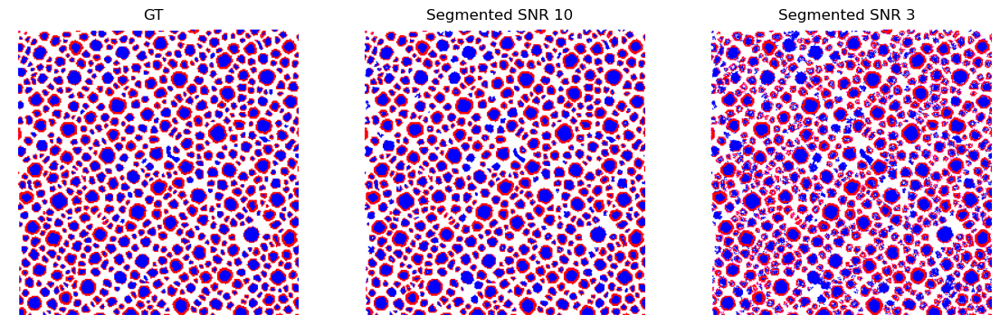

In [74]:
images = [seg_gt_0 , seg_snr_10, seg_snr_3]
im_names = ["GT" , "Segmented SNR 10" , "Segmented SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(14, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

In order for us to be able to count and calculate the inner and outer radii of the axons, we separate the inner and outer layer of the axons for each of the three images. In the following cells, we can see the results of that separation.

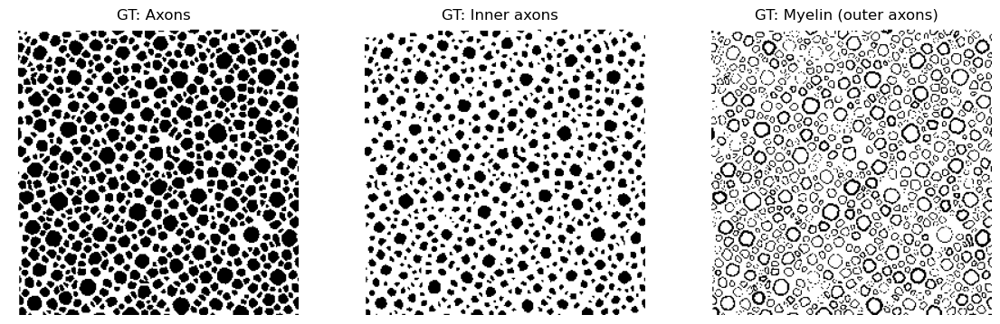

In [75]:
images = [seg_gt_0[:,:,1], seg_gt_0[:,:,0], 255 - (seg_gt_0[:,:,1] - seg_gt_0[:,:,0])]
im_names = ["GT: Axons", "GT: Inner axons", "GT: Myelin (outer axons)"]

fig, axes = plt.subplots(1, 3, figsize=(14, 6))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

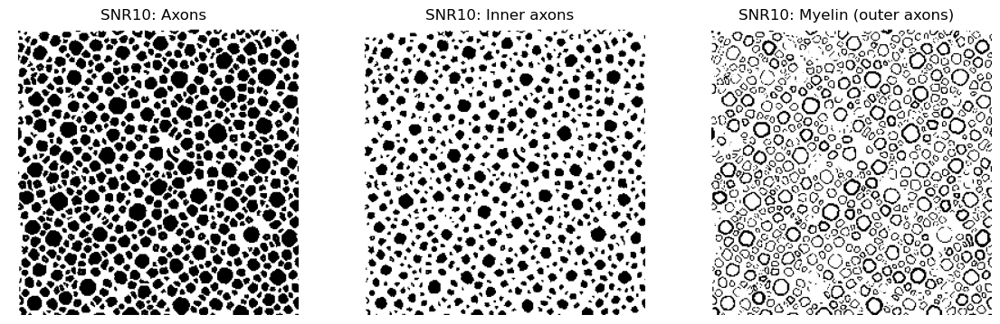

In [76]:
images = [seg_snr_10[:,:,1], seg_snr_10[:,:,0], 255 - (seg_snr_10[:,:,1] - seg_snr_10[:,:,0])]
im_names = ["SNR10: Axons", "SNR10: Inner axons", "SNR10: Myelin (outer axons)"]

fig, axes = plt.subplots(1, 3, figsize=(14, 6))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

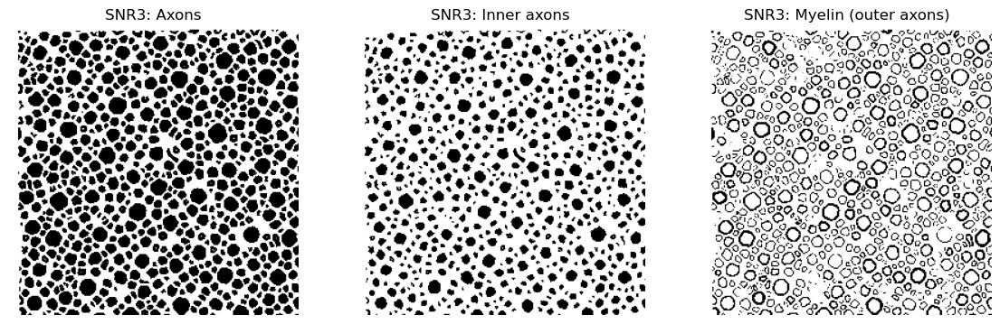

In [77]:
mages = [seg_snr_3[:,:,1], seg_snr_3[:,:,0], 255 - (seg_snr_3[:,:,1] - seg_snr_3[:,:,0])]
im_names = ["SNR3: Axons", "SNR3: Inner axons", "SNR3: Myelin (outer axons)"]

fig, axes = plt.subplots(1, 3, figsize=(14, 6))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.3 Radii histograms 

To count the number of axons observed in the images, we use the `label` function from the `skimage.measure` module. This function returns a label image, where each object in the image is assigned a unique integer. We use this label image to count the number of objects in the image. Then, by using the `bincount` function from the `numpy` module, we can count the number of pixels of each object in the image, and using the fact that each pixel has an area of $0.01 \mu m^2$, we can calculate the inner and outer radii of each axon. Finally, we plot the radii histograms for each of the three images.

In [78]:
from skimage import measure

def count_and_radii(outer, inner, min_size=4):
    '''
    Count axons and compute inner and outer radii
    :param outer: the image representing the whole axons (inner + outer)
    :param inner: the image representing the inner axons
    :param min_size: the minimum size of the axons to be counted, default is 4 since that is the minimum size in the ground truth image

    :return: count of axons and inner axons, as well as inner and outer radii
    '''
    # labeled_outer and labeled_inner are labeled arrays, where all connected regions are assigned the same integer value
    labeled_outer = measure.label(outer, background=255)
    labeled_inner = measure.label(inner, background=255)

    # count number of pixels in each region but remove the first element, the background
    outer_area = np.bincount(labeled_outer.ravel())[1:]
    inner_area = np.bincount(labeled_inner.ravel())[1:]
    
    #Remove very small objects (noisy point on image) composed of only a couple of pixels
    #In the ground truth the min is 4, therefore remove smaller objects in the noisy images
    outer_area = outer_area[outer_area >= min_size]
    inner_area = inner_area[inner_area >= min_size]
    
    #Count number of objects
    count_outer = len(outer_area)
    count_inner = len(inner_area)
    
    # calculate the radius of each region
    # each pixel has area 0.01 μm^2
    outer_area = outer_area * 0.01
    inner_area = inner_area * 0.01    

    # radii distributions
    radii_outer = np.sqrt(outer_area / np.pi)
    radii_inner = np.sqrt(inner_area / np.pi)

    return count_outer, count_inner, [radii_inner, radii_outer]

In [ ]:
# Counting axons and myelin and computing radii
#gt_0
count_myelin_gt, count_axon_gt, radii_gt_0 = count_and_radii(seg_gt_0[:,:,1], seg_gt_0[:,:,0], min_size = 4)
print("GT: Number of axons detected: ", count_axon_gt)
print("GT: Number of myelin detected: ", count_myelin_gt)
print()

#snr_10
count_myelin_snr10, count_axon_snr10, radii_snr_10 = count_and_radii(seg_snr_10[:,:,1], seg_snr_10[:,:,0], min_size = 4)
print("SNR10: Number of axons detected: ", count_axon_snr10)
print("SNR10: Number of myelin detected: ", count_myelin_snr10)
print()

#snr_3
count_myelin_snr3, count_axon_snr3, radii_snr_3 = count_and_radii(seg_snr_3[:,:,1], seg_snr_3[:,:,0], min_size = 4)
print("SNR3: Number of axons detected: ", count_axon_snr3)
print("SNR3: Number of myelin detected: ", count_myelin_snr3)

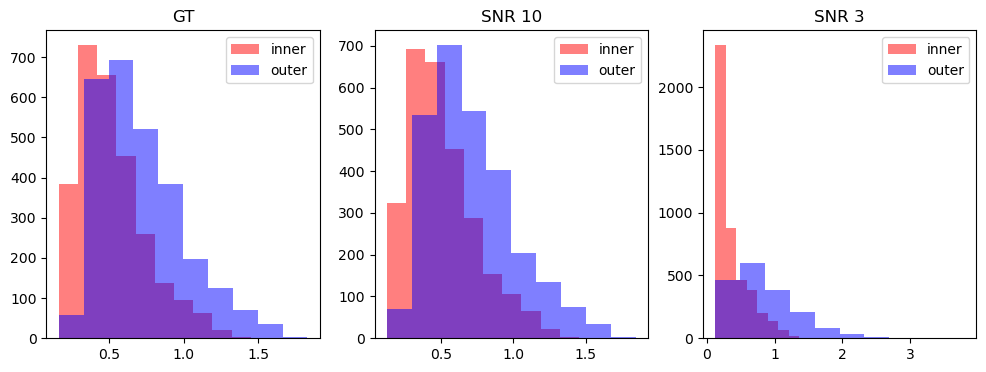

In [81]:
## Results that show the Radii distribution
import numpy as np

rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)

rads_gt = radii_gt_0
rads_test0 = radii_snr_10  
rads_test1 = radii_snr_3  

all_rads = [rads_gt, rads_test0, rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


We observe that for the SNR10 image, we are able to detect the axons with a good accuracy. However, for the SNR3 image, we are not able to detect the axons as well as for the SNR10 image. One explanation to this is that the SNR3 image still has a lot of background noise, which makes it harder to detect the axons using our threshold implementation. When confronted with an image with a lot of noise, one could improve the algorithm by using a different segmentation method, such as edge detection.

In the radii histograms, we also observe that the histogram showing radii distribution for the SNR10 image corresponds well to the one for the GT image. However, the histogram for the SNR3 image does not correspond well to the one for the GT image, particularly for the inner radii due to the fact that a lot of noise pixels are classified as inner axons.

### 2.2 Low frequencies

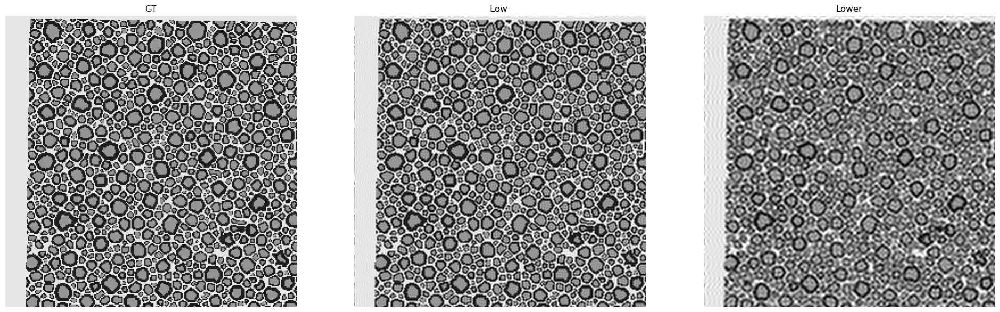

In [82]:
import cv2

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder+ files[0])
lowfreq0 = cv2.imread(path_folder+ files[1])
lowfreq1 = cv2.imread(path_folder+ files[2])

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

To make the gaussians modelling the histogram of the image values more spread out, we used a blur filter on the image.

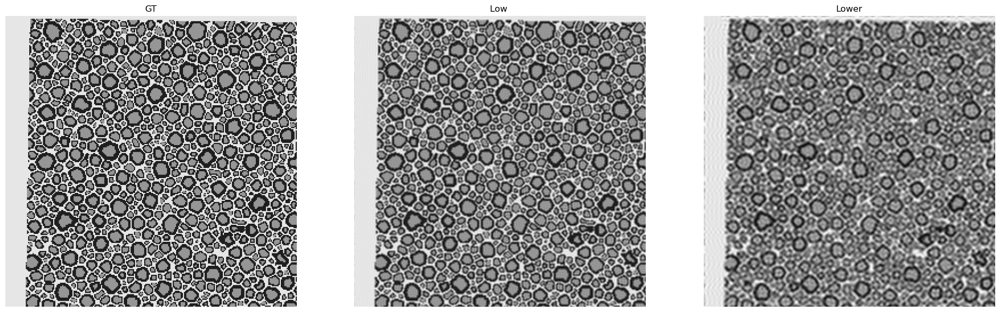

In [83]:
#We blur the low freq image

filter_low = cv2.blur(lowfreq0,(3,3))
filter_lower = cv2.blur(lowfreq1,(4,4))

images = [gt_3 , filter_low, filter_lower]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

As we wanted, we see that the gaussian modeling the histogram are more separated in the preprocessed image.

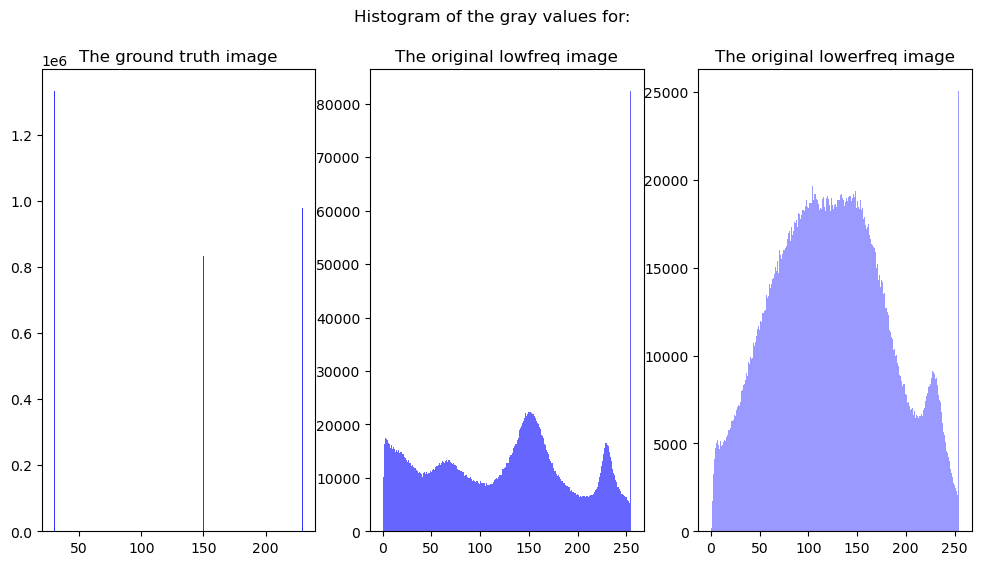

In [84]:
# Display histogram of each channel
fig, ax = plt.subplots(1, 3, figsize=(12, 6))

ax[0].hist(gt_3.ravel(), bins = 256, color = 'blue', alpha = 0.8)
ax[0].set_title('The ground truth image')

ax[1].hist(lowfreq0.ravel(), bins = 256, color = 'blue', alpha = 0.6)
ax[1].set_title('The original lowfreq image')

ax[2].hist(lowfreq1.ravel(), bins = 256, color = 'blue', alpha = 0.4)
ax[2].set_title('The original lowerfreq image')

plt.suptitle("Histogram of the gray values for:")
plt.show()

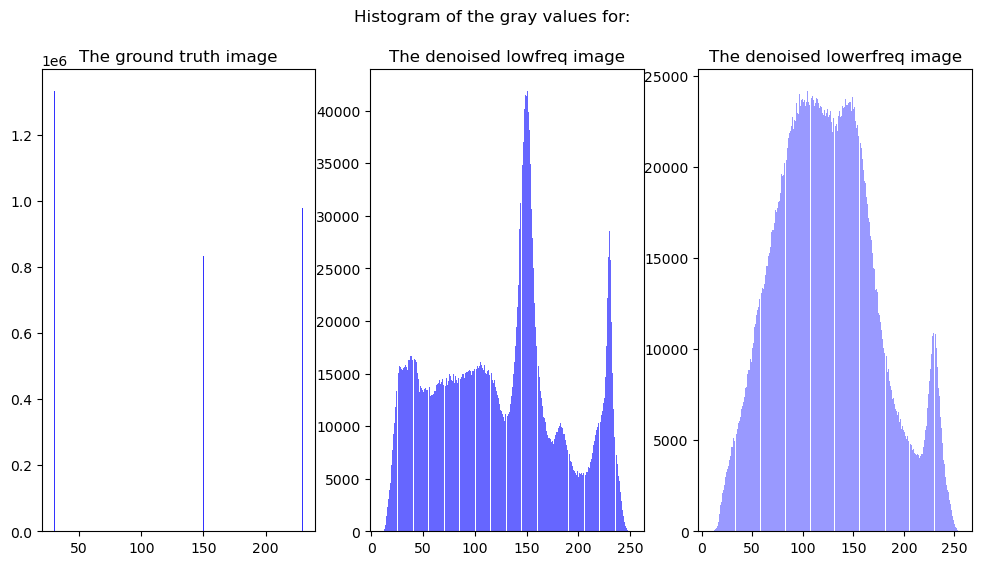

In [85]:
# Display histogram of each channel
fig, ax = plt.subplots(1, 3, figsize=(12, 6))

ax[0].hist(gt_3.ravel(), bins = 256, color = 'blue', alpha = 0.8)
ax[0].set_title('The ground truth image')

ax[1].hist(filter_low.ravel(), bins = 256, color = 'blue', alpha = 0.6)
ax[1].set_title('The denoised lowfreq image')

ax[2].hist(filter_lower.ravel(), bins = 256, color = 'blue', alpha = 0.4)
ax[2].set_title('The denoised lowerfreq image')

plt.suptitle("Histogram of the gray values for:")
plt.show()



### 2.2.2 Results Segmetations




To perform the segmentation, we use the same method as before, that is, we apply the thresholds by inspection of the histograms. We use the predefined function `segmentation_thresholds` to segment the three images:

In [86]:
# Segment images using thresholds observed from the histograms
#gt_3
thre_gt_3 = [50,175]
seg_gt_3 = segmentation_thresholds(gt_3, thre_gt_3)

#low
thre_low = [115,160]
seg_low = segmentation_thresholds(filter_low, thre_low)

#lower
thre_lower = [130,190]
seg_lower = segmentation_thresholds(lowfreq1, thre_lower)

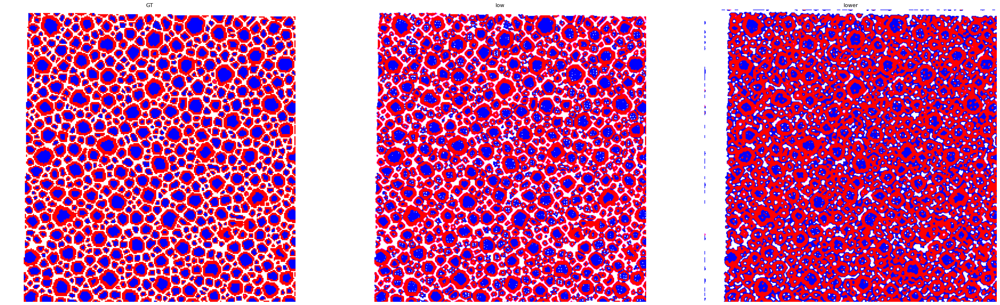

In [87]:
images = [seg_gt_3 , seg_low, seg_lower]
im_names = ["GT" , "low" , "lower"]
fig, axes = plt.subplots(1, 3, figsize=(40, 50))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.3 Radii histrograms

As before, we count the number of axons observed in the images, and calculate the inner and outer radii of the axons. Then, we plot the radii histograms for each of the three images.

In [88]:
#gt_3
count_myelin_gt3, count_axon_gt3, radii_gt_3 = count_and_radii(seg_gt_3[:,:,1], seg_gt_3[:,:,0], min_size = 4)
print("GT: Number of axons detected: ", count_axon_gt3)
print("GT: Number of myelin detected: ", count_myelin_gt3)
print()

#low
count_myelin_low, count_axon_low, radii_low = count_and_radii(seg_low[:,:,1], seg_low[:,:,0], min_size = 4)
print("Low: Number of axons detected: ", count_axon_low)
print("Low: Number of myelin detected: ", count_myelin_low)
print()

#lower
count_myelin_lower, count_axon_lower, radii_lower = count_and_radii(seg_lower[:,:,1], seg_lower[:,:,0], min_size = 4)
print("Lower: Number of axons detected: ", count_axon_lower)
print("Lower: Number of myelin detected: ", count_myelin_lower)

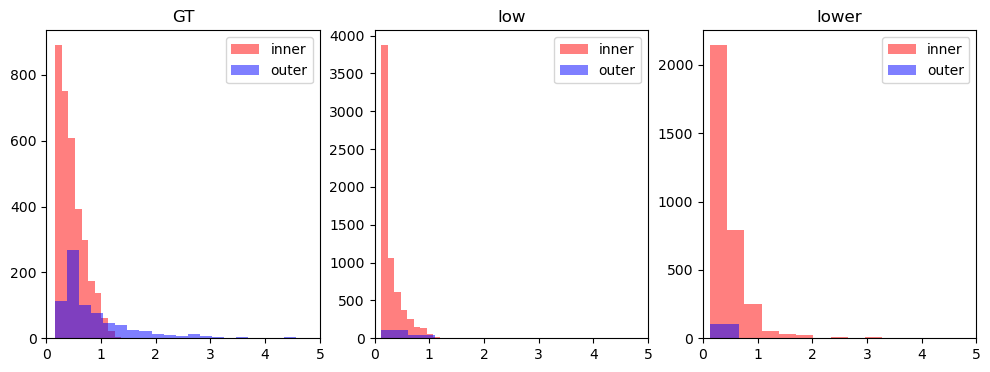

In [132]:
## results Radii distribution. proposal feel free to change it
import numpy as np

rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)

rads_gt = radii_gt_3
rads_test0 = radii_low  # your result
rads_test1 = radii_lower  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_3, lowfreq0 , lowfreq1]
im_names = ["GT" , "low" , "lower"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5, bins=100)
    ax.legend()
    ax.set_title(nm)
    ax.set_xlim(0,5)
plt.show()


For the images we see that our algorithm has difficulties identifying the outer axons. Indeed, the distributions of the inner axons in the low frequency images are similar to the one of the ground truth. However, this not the case for the outer axons.

## What could we do differently?

As discussed above the algorithm had difficulty on the more degraded image. Nonetheless, it was quite successful on the image with less degradation. On way we could improve this is by adding more pre-processing steps to remove the noise more efficiently. For example, deep learning-based methods are now commonly used to denoised image, we could try to use one.

Moreover, we defined the thresholds manually by visual inspection of the histogram. This could be done more efficiently by using a method that compute the thresholds for us. 

Finally, using another segmentation method such as region growing could improve our results as the resulting segemntations tend to be less noily.

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

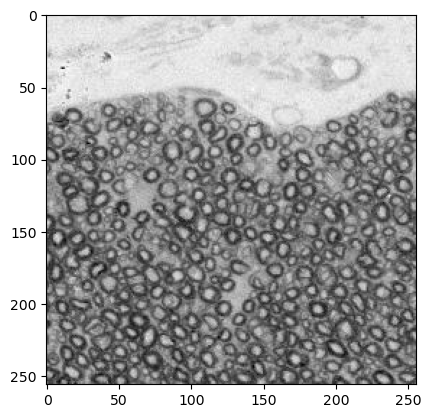

In [90]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])
plt.show()

We first equalize the histogram to increase the contrast in the image for a better segmentation.

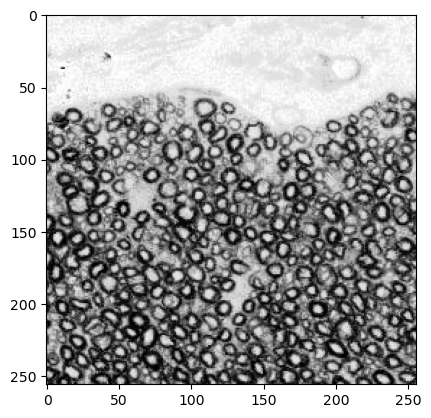

In [91]:
out = cv2.equalizeHist(real_data[:,:,0])
out =cv2.merge((out, out, out))
plt.imshow(out[:256, :256], cmap='gray')

We see on the histograms bellow that the pics are more spread out after the equalization. Therefore, it should be easier to segement the image.

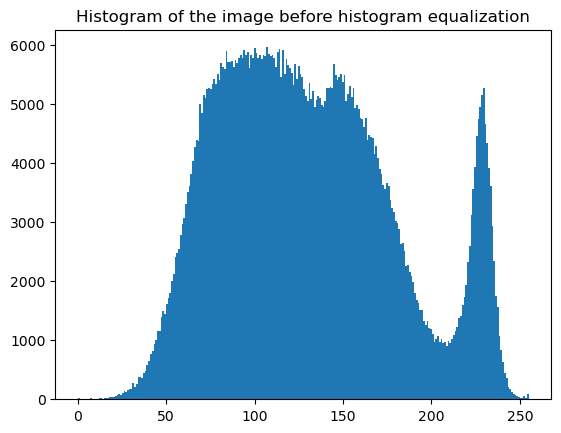

In [94]:
plt.hist(real_data.ravel(), bins=256)
plt.title('Histogram of the image before histogram equalization')
plt.show()

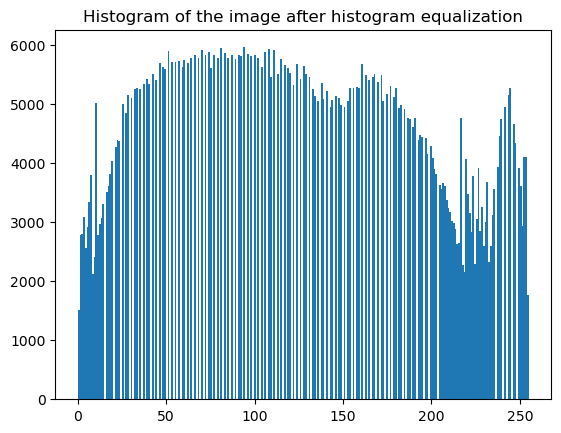

In [92]:
plt.hist(out.ravel(), bins=256)
plt.title('Histogram of the image after histogram equalization')
plt.show()

We define a slighly modified version of the segmentation algorithm as in this image the backround is darker than the inner axons. 

In [95]:
def segmentation_thresholds(img:np.array, thres:list):
    '''
    Segment images using thresholds observed from the histograms, with a white background, blue inner axons and red outer axons.
    :param img: the image to be segmented
    :param thres: list of threshold values
    :return: the segmented image
    '''
    seg = np.zeros_like(img)
    #Define background (white)
    seg[:,:,:] = [255,255,255]
    
    #Define inner axons (blue)
    seg[img[:,:,0] > thres[1],:]  = [0,0,255] #Now >, in other segmentation algo was <
    
    #Define outer axons (red)
    seg[img[:,:,0] < thres[0],:]  = [255,0,0]
    
    #Clean segmentation
    #On blue channel, remove small dots in background
    noice = remove_small_holes(seg[:,:,0], area_threshold=5).astype(np.uint8)
    seg[:,:,0] = noice*255
    
    #On red channel, remove small dots in background
    noice = remove_small_holes(seg[:,:,1], area_threshold=5).astype(np.uint8)
    seg[:,:,1] = noice*255
    
    return seg

As one can see, our segmentation algorithm managed to sement relatively well the outer axons. However, it is harder for the algorithm to distinguish the pixels belonging to the background and the inner axons as the values ranges are quite close.

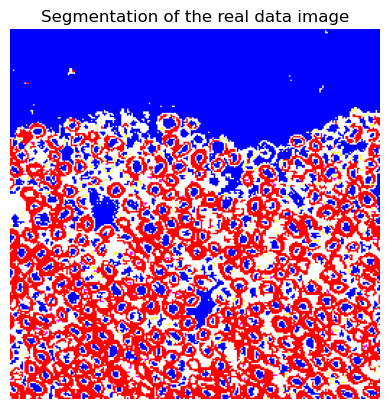

In [126]:
#Segment image using thresholds defined by histogram inspection
thre = [90, 180]
seg = segmentation_thresholds(out, thre)

plt.imshow(seg[:256, :256])
plt.title('Segmentation of the real data image')
plt.axis('off')
plt.show()

Let's visualize the distribution of the raddis. The x-axis is cropped as the some large object are considered inner axons since there are the same color as the inner axons. Therefore, we can filter out the large values of the computed raddis since there are most likely not axons.

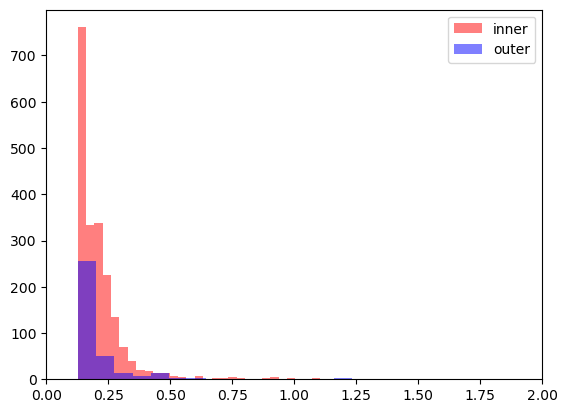

In [127]:
count_myelin, count_axon, radii = count_and_radii(seg[:,:,1], seg[:,:,0])

plt.hist(radii[0] , color = "red" , label = "inner" ,alpha= 0.5, bins=300)
plt.hist(radii[1] , color = "blue" , label = "outer" ,alpha= 0.5, bins=300)
plt.legend(); plt.xlim(0,2)
plt.show()